<a href="https://colab.research.google.com/github/Manos-Mak120/Makrakis-Manos/blob/main/Baiden_Teasers_WordCloud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

import time
import random

from tqdm import tqdm

In [ ]:
def get_webpage_soup(url):
  headers = {
        "User-Agent": "Mozilla/5.0"
    }
  response = requests.get(url, headers=headers)
  if response.status_code != 200:
    return None
  else:
    return BeautifulSoup(response.text, 'html.parser')

In [ ]:
def get_article_elements_from_soup(soup, article_url):
    # title
    try:
        title = soup.find("h1").text.strip()
    except:
        title = ""

    # datetime
    try:
        datetime_str = soup.find("time")["datetime"]
        date_str = datetime_str.split("T")[0]
        time_str = datetime_str.split("T")[1].split("+")[0]
    except:
        date_str = ""
        time_str = ""

    # section
    try:
        section_div = soup.find("div", class_="main-category-block") or soup.find("div", class_="main-category")
        section = section_div.text.strip() if section_div else ""
    except:
        section = ""

    # author
    try:
      author_tag = soup.find("a", class_="author-name") or soup.find("span", class_="author-name")
      author = author_tag.text.strip() if author_tag else ""
    except:
        author = ""
    # excerpt
    try:
        excerpt_div = soup.find("div", class_="p.main-intro") or soup.find(itemprop="description") or soup.find("div", class_="nx-excerpt")
        excerpt = excerpt_div.text.strip() if excerpt_div else ""
    except:
        excerpt = ""

    # text body
    try:
      content_div = soup.find("div", class_="main-text story-fulltext")
      elements = content_div.find_all(["p", "h2", "h3", "ul", "ol", "li"]) if content_div else []
      text_body = " ".join(el.get_text(strip=True) for el in elements if el.get_text(strip=True))
    except:
        text_body = ""

    # feature image
    try:
        img_block = soup.find("div", class_="article-image") or soup.find("figure")
        feat_img_link = img_block.find("img")["src"] if img_block and img_block.find("img") else ""
    except:
        feat_img_link = ""

    # image caption
    try:
        caption_div = soup.find("div", class_="image-caption") or soup.find("figcaption")
        image_caption = caption_div.text.strip() if caption_div else ""
    except:
        image_caption = ""

    articleD = {
        "article_url": article_url,
        "title": title,
        "date": date_str,
        "time": time_str,
        "section": section,
        "author": author,
        "excerpt": excerpt,
        "text_body": text_body,
        "feat_img_link": feat_img_link,
        "feat_img_cation": image_caption
    }

    return articleD

In [ ]:
def scrape_newsbomb_articles_pages(biden_21):
  all_articles_dataL = []
  base_url = "newbomb"
  for idx, row in tqdm(biden_21.iterrows(), total=biden_21.shape[0], desc="Processing rows"):
    article_url_relative = row['article_url']
    article_url = base_url + article_url_relative
    soup = get_webpage_soup(article_url)
    if soup:
     articleD = get_article_elements_from_soup(soup, article_url)
     all_articles_dataL.append(articleD)
     delay = random.uniform(1, 3)
     time.sleep(delay)
  df = pd.DataFrame(all_articles_dataL)
  print(f"\nScraping completed. Fetshed {len(df)} articles.")
  return df

In [ ]:
biden_21 = pd.read_csv("/content/drive/MyDrive/Εργασία Python/scrappers/biden_2021.new.csv")

In [ ]:
biden_21

,title,article_url,date,time,section,excerpt
0,Μπάιντεν: Διάγγελμα για το Αφγανιστάν- O Αμερι...,/kosmos/story/1228361/mpainten-diaggelma-toy-a...,2021-08-31,22:55,ΚΟΣΜΟΣ,Mήνυμα στον αμερικανικό λαό απηύθυνε ο πρόεδρο...
1,Μπλίνκεν: Θα συνεργαστούμε με τους Ταλιμπάν εά...,/kosmos/story/1228111/mplinken-tha-synergastoy...,2021-08-31,06:15,ΚΟΣΜΟΣ,«Κάθε βήμα που θα κάνουμε δεν θα βασίζεται στο...
2,Νέο διάγγελμα Μπάιντεν για το Αφγανιστάν,/kosmos/story/1228104/neo-diaggelma-mpainten-g...,2021-08-31,02:00,ΚΟΣΜΟΣ,Ο αμερικανός πρόεδρος Τζο Μπάιντεν θα εκφραστε...
3,Τυφώνας Άιντα: Η στιγμή που οι σφοδροί άνεμοι ...,/kosmos/story/1227974/tyfonas-ainta-h-stigmi-p...,2021-08-30,15:17,ΚΟΣΜΟΣ,Ο τυφώνας Άιντα έφθασε πάνω από το έδαφος όντα...
4,Σάλος με τον Μπαίντεν να κοιτά το ρολόι του στ...,/kosmos/story/1227963/salos-me-ton-mpainten-na...,2021-08-30,14:45,ΚΟΣΜΟΣ,Πύρα δέχεται ο πρόεδρος των ΗΠΑ Τζο Μπάιντεν μ...
...,...,...,...,...,...,...
906,Εκλογές ΗΠΑ 2020: Όλα τα μάτια στραμμένα στο π...,/kosmos/story/1121995/ekloges-hpa-2020-ola-ta-...,2020-09-28,19:22,ΚΟΣΜΟΣ,Σε λίγες ώρες (4 τα ξημερώματα ώρα Ελλάδος) θα...
907,Αμερικανικές εκλογές 2020: «Θρίλερ» στις κρίσι...,/kosmos/story/1121668/amerikanikes-ekloges-202...,2020-09-27,19:45,ΚΟΣΜΟΣ,"Το προβάδισμα του Τζο Μπάιντεν, του υποψηφίου ..."
908,Τραμπ: Ο Τζο Μπάιντεν ντοπάρεται για να δίνει ...,/kosmos/story/1117092/tramp-o-tzo-mpainten-nto...,2020-09-12,06:15,ΚΟΣΜΟΣ,"Ο πρόεδρος των ΗΠΑ Ντόναλντ Τραμπ, χωρίς ακόμη..."
909,Ο πρόεδρος Τραμπ και ο πρώην αντιπρόεδρος Τζο ...,/kosmos/story/1117065/o-proedros-tramp-kai-o-p...,2020-09-11,23:57,ΚΟΣΜΟΣ,Ο υποψήφιος των Δημοκρατικών για την προεδρία ...


In [ ]:
# prompt: φέρε τα teasers που αφορούν τις αμερικανικές εκλογές

# Assuming 'title' or 'excerpt' columns contain the relevant information
# You might need to adjust the column name(s) based on your DataFrame

keyword = "αμερικανικές εκλογές"

# Filter rows where the keyword is in the 'title' or 'excerpt' column
# You can add more columns to the filter if needed
election_teasers = biden_21[
    biden_21['title'].str.contains(keyword, na=False, case=False) |
    biden_21['excerpt'].str.contains(keyword, na=False, case=False)
]

# Display the filtered DataFrame
print(f"Found {len(election_teasers)} teasers related to '{keyword}':")
election_teasers


Found 41 teasers related to 'αμερικανικές εκλογές':


,title,article_url,date,time,section,excerpt
338,Στο «κόκκινο» οι σχέσεις ΗΠΑ-Ρωσίας: Κυρώσεις ...,/kosmos/story/1186536/sto-kokkino-oi-sxeseis-h...,2021-04-15,09:45,ΚΟΣΜΟΣ,Κυρώσεις ενάντια στη Μόσχα για την φερόμενη εμ...
614,Ρωσία - ΗΠΑ: Ο πρόεδρος Πούτιν συνεχάρη τον Μπ...,/kosmos/story/1147280/rosia-hpa-o-proedros-poy...,2020-12-15,09:55,ΚΟΣΜΟΣ,Ο Ρώσος πρόεδρος Βλαντίμιρ Πούτιν συνεχάρη σήμ...
651,Εκλογές ΗΠΑ: «Μύλος» με την Τζόρτζια - Δόθηκε ...,/kosmos/story/1138993/ekloges-hpa-mylos-me-tin...,2020-11-20,21:58,ΚΟΣΜΟΣ,Αμερικανικές Εκλογές Αποτελέσματα: Νωρίτερα έγ...
663,Εκλογές ΗΠΑ: Εκατοντάδες οπαδοί του Τραμπ στην...,/kosmos/story/1136925/ekloges-hpa-ekatontades-...,2020-11-14,19:31,ΚΟΣΜΟΣ,Αμερικανικές εκλογές: Οπαδοί του Ντόναλντ Τραμ...
700,Αμερικανικές Εκλογές 2020: Η συγκινητική φωτογ...,/kosmos/story/1134757/amerikanikes-ekloges-202...,2020-11-08,13:46,ΚΟΣΜΟΣ,Η φωτογραφία δημοσιεύτηκε από την εγγονή του ν...
702,Αμερικανικές Εκλογές 2020: Το προσωπικό δράμα ...,/kosmos/story/1134227/amerikanikes-ekloges-202...,2020-11-08,12:23,ΚΟΣΜΟΣ,Μια ζωή γεμάτη τραγωδίες έχει ζήσει ο νέος πρό...
718,Αμερικανικές Εκλογές 2020: Δείτε τι έκανε ο Τρ...,/kosmos/story/1134624/amerikanikes-ekloges-202...,2020-11-07,22:02,ΚΟΣΜΟΣ,"Αμερικανικές Εκλογές: Ο απερχόμενος πρόεδρος, ..."
721,Εκλογές ΗΠΑ 2020: Μήνυμα της Προέδρου της Δημο...,/politikh/story/1134611/ekloges-hpa-2020-minym...,2020-11-07,21:30,ΠΟΛΙΤΙΚΗ,Αμερικανικές Εκλογές – Αποτελέσματα: Συγχαρητή...
724,Αμερικανικές Εκλογές 2020: «Τάπα» Μπάιντεν σε ...,/kosmos/story/1134605/amerikanikes-ekloges-202...,2020-11-07,20:57,ΚΟΣΜΟΣ,Εκλογές ΗΠΑ – Αποτελέσματα: Ο ΛεΜπρόν Τζέιμς σ...
726,Ομπάμα για Μπάιντεν: «Δεν θα μπορούσα να είμαι...,/kosmos/story/1134600/ompama-gia-mpainten-den-...,2020-11-07,20:37,ΚΟΣΜΟΣ,Αμερικανικές Εκλογές – Αποτελέσματα: Ο Μπαράκ ...


In [ ]:
# prompt: φέρε τα teasers που αφορούν τις αμερικανικές εκλογές

# Assuming 'title' or 'excerpt' columns contain the relevant information
# You might need to adjust the column name(s) based on your DataFrame

keyword = "Ελλάδα"

# Filter rows where the keyword is in the 'title' or 'excerpt' column
# You can add more columns to the filter if needed
election_teasers = biden_21[
    biden_21['title'].str.contains(keyword, na=False, case=False) |
    biden_21['excerpt'].str.contains(keyword, na=False, case=False)
]

# Display the filtered DataFrame
print(f"Found {len(election_teasers)} teasers related to '{keyword}':")
election_teasers


Found 47 teasers related to 'Ελλάδα':


,title,article_url,date,time,section,excerpt
24,Ελληνοτουρκικά: Γιατί ο Ερντογάν αισθάνεται πι...,/ellada/ethnika/story/1226165/ellinotoyrkika-g...,2021-08-24,06:06,ΕΘΝΙΚΑ,Μήπως ήρθε η ώρα να αναθεωρήσει η Ελλάδα τη στ...
29,ΗΠΑ: Ο πρόεδρος Τζο Μπάιντεν θα απευθύνει σήμε...,/kosmos/story/1225702/hpa-o-proedros-tzo-mpain...,2021-08-22,07:18,ΚΟΣΜΟΣ,Ο κ. Μπάιντεν σκοπεύει να απευθύνει ομιλία στο...
54,Mενέντεζ: Έκκληση στην κυβέρνηση Μπάιντεν για ...,/kosmos/story/1222234/menentez-ekklisi-stin-ky...,2021-08-09,10:29,ΚΟΣΜΟΣ,Οι ΗΠΑ πρέπει να στείλουν πρόσθετη βοήθεια στη...
74,Oλυμπιακοί Aγώνες 2020: Tι θα δούμε στην Τελετ...,/kosmos/story/1217394/olympiakoi-agones-2020-t...,2021-07-23,09:03,ΚΟΣΜΟΣ,Στις 2 μ.μ. ώρα Ελλάδας ολόκληρος ο πλανήτης θ...
142,Μπάιντεν – Ερντογάν – ΝΑΤΟ: To Know us better ...,/ellada/ethnika/story/1206137/mpainten-erntoga...,2021-06-15,16:38,ΕΘΝΙΚΑ,Μια πρώτη ανάλυση για τα ελληνοτουρκικά και τη...
157,Σύνοδος ΝΑΤΟ: Έληξε το τελεσίγραφο Μπάιντεν σε...,/ellada/ethnika/story/1205520/synodos-nato-eli...,2021-06-14,09:46,ΕΘΝΙΚΑ,Απαντήσεις περιμένει ο Αμερικανός πρόεδρος – Π...
263,Οικονομικό Φόρουμ Δελφών - Πάιατ: Ο Μπάιντεν ...,/politikh/story/1194478/oikonomiko-foroym-delf...,2021-05-10,19:26,ΠΟΛΙΤΙΚΗ,Ο Πρόεδρος Μπάιντεν και ο Αμερικανός υπουργός ...
268,Defender Europe 2021: Αμερικανική «φόλα» στον ...,/ellada/ethnika/story/1193718/defender-europe-...,2021-05-08,06:25,ΕΘΝΙΚΑ,Τι σημαίνει η αμερικανική απόβαση στην Αλεξανδ...
285,Τι κερδίζει η Ελλάδα από την αναγνώριση της Γε...,/ellada/ethnika/story/1190899/ti-kerdizei-i-el...,2021-05-01,07:00,ΕΘΝΙΚΑ,Η αναγνώριση της Γενοκτονίας των Αρμενίων από ...
334,Αλέξανδρος Μαλλιάς: Η Ελλάδα να επιδιώξει δέσμ...,/ellada/ethnika/story/1186794/alexandros-malli...,2021-04-18,08:10,ΕΘΝΙΚΑ,"Η Ελλάδα πρέπει να επιδιώξει, στο πλαίσιο της ..."


In [ ]:
# prompt: φέρε τα teasers που αφορούν τις αμερικανικές εκλογές

# Assuming 'title' or 'excerpt' columns contain the relevant information
# You might need to adjust the column name(s) based on your DataFrame

keyword = "Τουρκία"

# Filter rows where the keyword is in the 'title' or 'excerpt' column
# You can add more columns to the filter if needed
election_teasers = biden_21[
    biden_21['title'].str.contains(keyword, na=False, case=False) |
    biden_21['excerpt'].str.contains(keyword, na=False, case=False)
]

# Display the filtered DataFrame
print(f"Found {len(election_teasers)} teasers related to '{keyword}':")
election_teasers


Found 47 teasers related to 'Τουρκία':


,title,article_url,date,time,section,excerpt
24,Ελληνοτουρκικά: Γιατί ο Ερντογάν αισθάνεται πι...,/ellada/ethnika/story/1226165/ellinotoyrkika-g...,2021-08-24,06:06,ΕΘΝΙΚΑ,Μήπως ήρθε η ώρα να αναθεωρήσει η Ελλάδα τη στ...
83,Ο Μπάιντεν επέλεξε τον Τζεφ Φλέικ για πρεσβευτ...,/kosmos/story/1214642/o-mpainten-epelexe-ton-t...,2021-07-14,01:15,ΚΟΣΜΟΣ,Ο πρόεδρος των ΗΠΑ Τζο Μπάιντεν επέλεξε τον Ρε...
120,Παιχνίδια Ερντογάν,/epi-tis-ousias/story/1206968/paixnidia-erntogan,2021-06-18,06:03,ΕΠΙ ΤΗΣ ΟΥΣΙΑΣ,"Σε ένα παιχνίδι τακτικισμών, επιδίδεται τα τελ..."
122,Ικανοποίηση ΗΠΑ για τη «σαφή δέσμευση» της Του...,/kosmos/story/1206937/ikanopoiisi-hpa-gia-ti-s...,2021-06-17,21:51,ΚΟΣΜΟΣ,Οι ΗΠΑ χαιρέτισαν σήμερα μια «σαφή δέσμευση» ε...
125,Ερντογάν: Είπα στον Μπάιντεν να μην περιμένει ...,/kosmos/story/1206787/erntogan-eipa-ston-mpain...,2021-06-17,13:53,ΚΟΣΜΟΣ,Αμετάβλητη παραμένει η στάση της Τουρκίας σε ό...
140,Ο «γκρίζος λύκος» δεν γίνεται «αρνάκι»,/bomber/apopseis/story/1206251/erntogan-o-lyko...,2021-06-16,06:03,ΑΠΟΨΕΙΣ,Όταν η μέχρι πρότινος άκαμπτη και αμιγώς υπερο...
150,Σύνοδος ΝΑΤΟ: Ολοκληρώθηκε η συνάντηση Μπάιντε...,/kosmos/story/1205793/synodos-nato-oloklirothi...,2021-06-14,20:09,ΚΟΣΜΟΣ,Η πρώτη συνάντηση του Ρετζέπ Ταγίπ Ερντογάν με...
156,«O Μπάιντεν θα έπρεπε να κόψει τον Γόρδιο Δεσμ...,/kosmos/story/1205559/o-mpainten-tha-eprepe-na...,2021-06-14,10:51,ΚΟΣΜΟΣ,"O Toύρκος πρόεδρος, Ρετζέπ Ταγίπ Ερντογάν, έχε..."
171,Σύνοδος ΝΑΤΟ - Συνάντηση Μπάιντεν - Ερντογάν: ...,/kosmos/story/1204951/synodos-nato-synantisi-m...,2021-06-11,22:18,ΚΟΣΜΟΣ,Ο εκπρόσωπος της αμερικανικής διπλωματίας ξεκα...
176,«Τελεσίγραφο» ΗΠΑ σε Τουρκία: Δεν δεχόμαστε με...,/kosmos/story/1204656/telesigrafohpa-se-toyrki...,2021-06-11,08:37,ΚΟΣΜΟΣ,Κατηγορηματικός ο εκπρόσωπος του υπουργείου Εξ...


In [ ]:
# prompt: φέρε τα teasers που αφορούν τις αμερικανικές εκλογές

# Assuming 'title' or 'excerpt' columns contain the relevant information
# You might need to adjust the column name(s) based on your DataFrame

keyword = "ΝΑΤΟ"

# Filter rows where the keyword is in the 'title' or 'excerpt' column
# You can add more columns to the filter if needed
election_teasers = biden_21[
    biden_21['title'].str.contains(keyword, na=False, case=False) |
    biden_21['excerpt'].str.contains(keyword, na=False, case=False)
]

# Display the filtered DataFrame
print(f"Found {len(election_teasers)} teasers related to '{keyword}':")
election_teasers


Found 34 teasers related to 'ΝΑΤΟ':


,title,article_url,date,time,section,excerpt
142,Μπάιντεν – Ερντογάν – ΝΑΤΟ: To Know us better ...,/ellada/ethnika/story/1206137/mpainten-erntoga...,2021-06-15,16:38,ΕΘΝΙΚΑ,Μια πρώτη ανάλυση για τα ελληνοτουρκικά και τη...
146,Ποιες χώρες ανησυχούν εν όψει της συνόδου Μπάι...,/kosmos/story/1205734/poies-xores-anisyxoyn-en...,2021-06-15,06:04,ΚΟΣΜΟΣ,Κυβερνήσεις χωρών της κεντρικής και της ανατολ...
148,Ερντογάν: Αυτά συζήτησα με τον Μητσοτάκη – Χρή...,/ellada/ethnika/story/1205812/erntogan-ayta-sy...,2021-06-14,21:36,ΕΘΝΙΚΑ,Ο Ρετζέπ Ταγίπ Ερντογάν μετά το τέλος των συνα...
150,Σύνοδος ΝΑΤΟ: Ολοκληρώθηκε η συνάντηση Μπάιντε...,/kosmos/story/1205793/synodos-nato-oloklirothi...,2021-06-14,20:09,ΚΟΣΜΟΣ,Η πρώτη συνάντηση του Ρετζέπ Ταγίπ Ερντογάν με...
151,Σύνοδος ΝΑΤΟ: Ο Ερντογάν «φίλησε το χέρι» του ...,/kosmos/story/1205758/synodos-nato-o-erntogan-...,2021-06-14,17:25,ΚΟΣΜΟΣ,Το προσωπείο του διαλλακτικού και φιλειρηνικού...
152,Σύνοδος ΝΑΤΟ- Μπάιντεν: Θέλω η Ευρώπη να ξέρει...,/kosmos/story/1205677/synodos-nato-mpainten-th...,2021-06-14,14:13,ΚΟΣΜΟΣ,Ο Αμερικανός πρόεδρος Τζο Μπάιντεν δήλωσε σήμε...
153,Σύνοδος ΝΑΤΟ: Συναντήσεις Ερντογάν με Εμανουέλ...,/kosmos/story/1205655/synodos-nato-synantiseis...,2021-06-14,13:42,ΚΟΣΜΟΣ,"Συνάντηση κεκλεισμένων των θυρών έλαβε χώρα, σ..."
157,Σύνοδος ΝΑΤΟ: Έληξε το τελεσίγραφο Μπάιντεν σε...,/ellada/ethnika/story/1205520/synodos-nato-eli...,2021-06-14,09:46,ΕΘΝΙΚΑ,Απαντήσεις περιμένει ο Αμερικανός πρόεδρος – Π...
160,Μπάιντεν: «Ιερή υποχρέωση» η υπεράσπιση συμμάχ...,/kosmos/story/1205378/mpainten-ieri-ypoxreosi-...,2021-06-13,19:48,ΚΟΣΜΟΣ,"Ο Αμερικανός πρόεδρος, Τζο Μπάιντεν θεωρεί «ιε..."
163,Πολεμική Αεροπορία: Αυτό είναι το F-35 - Η «φο...,/ellada/ethnika/story/1204659/polemiki-aeropor...,2021-06-13,06:55,ΕΘΝΙΚΑ,Απόλυτη κυριαρχία των ελληνικών «φτερών» - Raf...


In [ ]:
biden_21.dtypes

,0
title,object
article_url,object
date,object
time,object
section,object
excerpt,object


In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

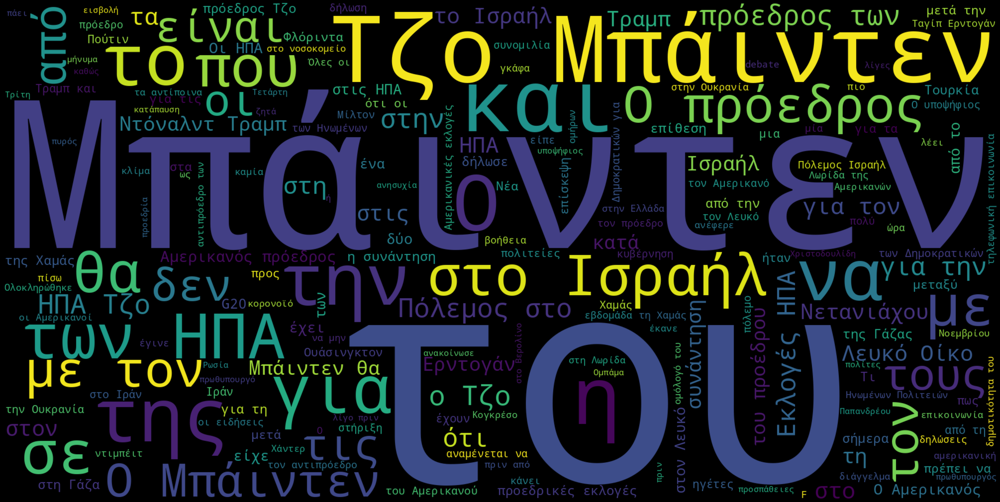

In [ ]:
wordcloud = WordCloud(  #ενώνει όλα τα κείμενα μαζί για να μας φέρει το wordcloud
    stopwords = STOPWORDS, # <- τα stopwords που θέλουμε να κοπούν
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(jan_text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής του κειμένου
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
list(STOPWORDS)[0:20]

["we've",
 'ours',
 'not',
 'was',
 'r',
 'so',
 'are',
 'these',
 'for',
 'her',
 "weren't",
 'during',
 "who's",
 'me',
 'those',
 'under',
 'them',
 "they're",
 'with',
 'shall']

In [ ]:
import spacy

In [ ]:
!python -m spacy download el_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 89.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
print(sorted(nlp.Defaults.stop_words)[0:20])

['άλλα', 'άλλες', 'άλλη', 'άλλην', 'άλλης', 'άλλο', 'άλλοι', 'άλλον', 'άλλος', 'άλλοτε', 'άλλους', 'άλλων', 'άμα', 'άμεσα', 'άνευ', 'άνω', 'άξαφνα', 'άρα', 'άραγε', 'έγιναν']


In [ ]:
def create_wordcloud(text):
  wordcloud = WordCloud(
      stopwords = nlp.Defaults.stop_words, # <- τα stopwords που θέλουμε να "κοπούν"
      width = 2000,
      height = 1000,
      background_color = 'black'
  ).generate(text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής που έχουμε βάλει στα arguements που δέχεται το function
  return wordcloud

In [ ]:
print(sorted(nlp.Defaults.stop_words)[0:20])

['άλλα', 'άλλες', 'άλλη', 'άλλην', 'άλλης', 'άλλο', 'άλλοι', 'άλλον', 'άλλος', 'άλλοτε', 'άλλους', 'άλλων', 'άμα', 'άμεσα', 'άνευ', 'άνω', 'άξαφνα', 'άρα', 'άραγε', 'έγιναν']


In [ ]:
wcloud = create_wordcloud(jan_text)
# το wcloud.words_ είναι ένα dictionary που τα keys είναι οι λέξεις και τα values οι συχνότητες
# βάζω τα items του dictionary σε λίστα για να μπορώ να δω μόνο ένα μέρος τους και όχι όλα
list(wcloud.words_.items())[:5]

[('Μπάιντεν', 1.0),
 ('Τζο Μπάιντεν', 0.7009345794392523),
 ('ΗΠΑ', 0.5841121495327103),
 ('Ισραήλ', 0.5093457943925234),
 ('πρόεδρος', 0.3177570093457944)]

In [ ]:
# function δημιουργίας της εικόνας του wordcloud  #ΓΙΑ ΔΗΜΙΟΥΡΓΙΑ ΕΙΚΟΝΑΣ
def create_wordcloud_img(text):
  wordcloud = create_wordcloud(text) # δημιουργία του wordcloud με το παραπάνω function
  # δημιουργία της εικόνας του wordcloud
  fig = plt.figure(
      figsize = (40, 30),
      facecolor = 'k',
      edgecolor = 'k')
  return plt.imshow(wordcloud)

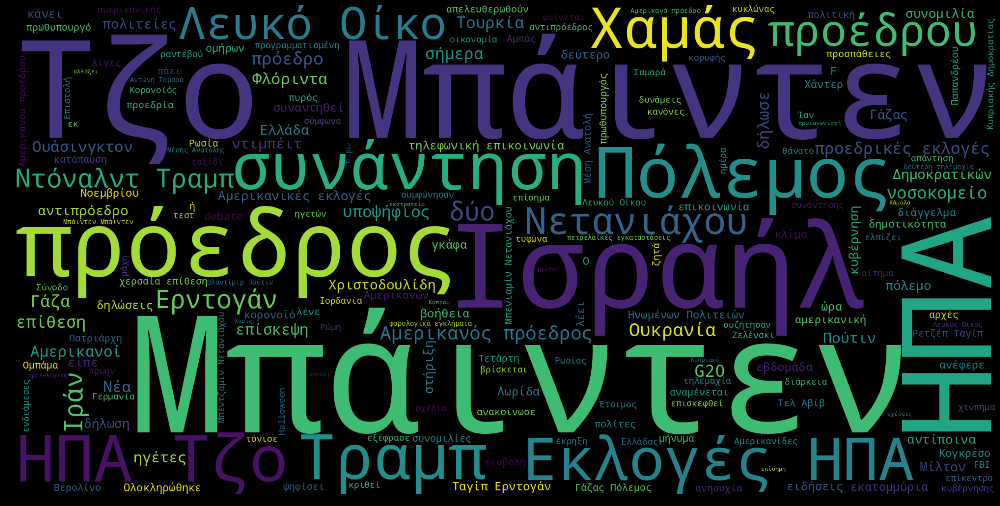

In [ ]:
create_wordcloud_img(jan_text)

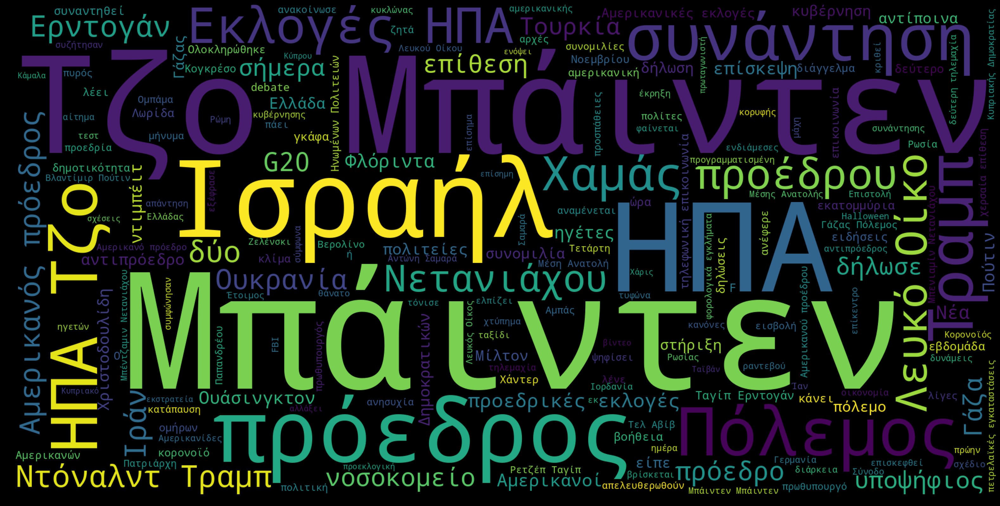

In [ ]:
create_wordcloud_img(jan_text)

In [ ]:
# προσθήκη λέξης στα stopwords
nlp.Defaults.stop_words.add("είπε")
# έλεγχος για το αν η λέξη τροχαίο είναι στα stopwords
print(nlp.vocab['είπε'].is_stop)

True


In [ ]:
# # αφαίρεση μιας λέξης από τα stopwords
nlp.Defaults.stop_words.remove('είπε')

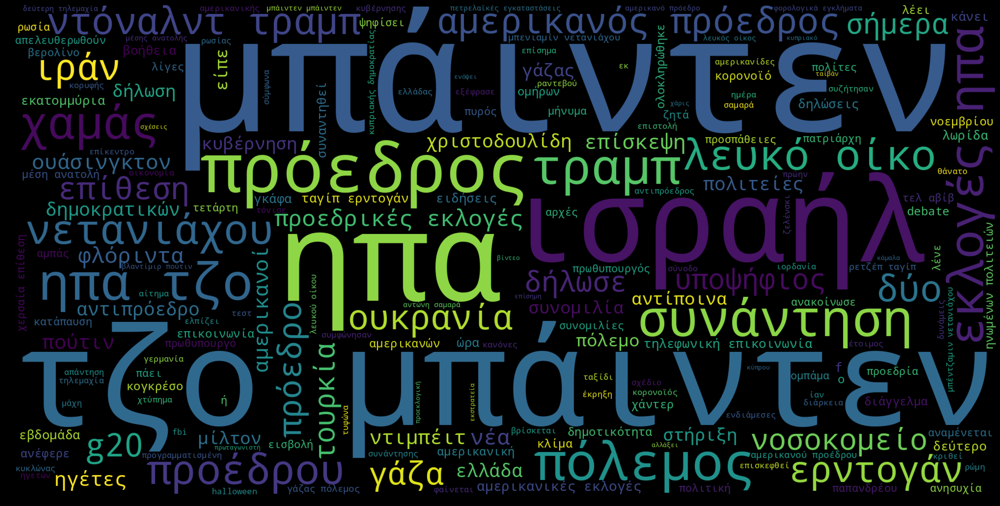

In [ ]:
jan_text_lower = jan_text.lower()
create_wordcloud_img(jan_text_lower)

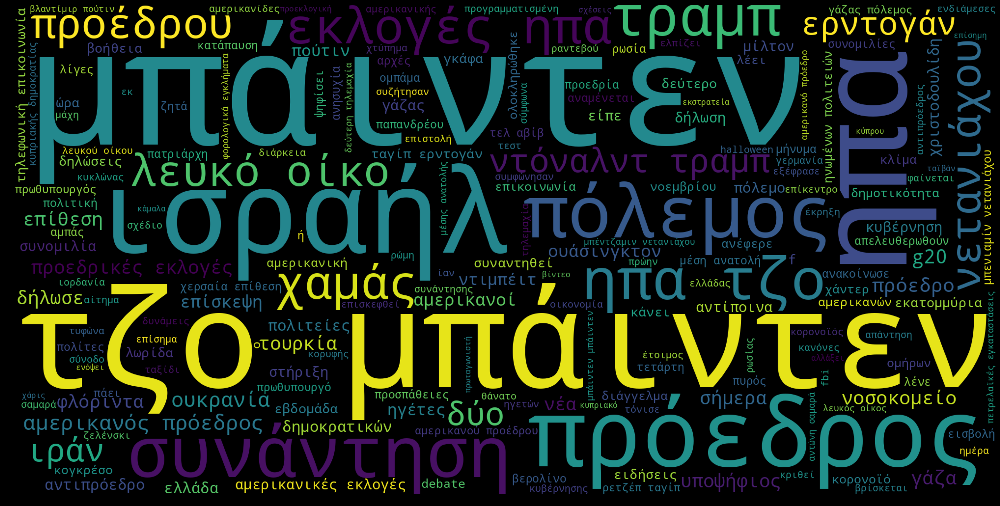

In [ ]:
jan_text_lower = jan_text_lower.replace("Ρωσίας", "προέδρου")
create_wordcloud_img(jan_text_lower)

In [ ]:
custom_stopwords = {'είπε', 'π.χ.', 'κλπ'}
for word in custom_stopwords:
   if word not in nlp.Defaults.stop_words:
    nlp.Defaults.stop_words.add(word)
    lex_attr = nlp.vocab[word]
    lex_attr.is_stop = True

In [ ]:
jan_doc = nlp(jan_text_lower)

# ας δούμε μερικά tokens και την αναγνώριση του μέρους του λόγου (part of speech: pos) που κάνει το γλωσικό μας μοντέλο
for token in jan_doc[:10]:
    print(f"{token.text} -> {token.lemma_} ({token.pos_})")

τζο -> τζο (DET)
μπάιντεν -> μπάιντεν (ADJ)
: -> : (PUNCT)
δάγκωσε -> δάγκωσε (VERB)
στο -> σε ο (ADP)
πόδι -> πόδι (NOUN)
ένα -> ένας (DET)
μωρό -> μωρό (NOUN)
... -> ... (PUNCT)
ντυμένο -> ντυμένο (ADJ)


In [ ]:
tokenized_jan_doc = ' '.join(token.lemma_ for token in jan_doc)

In [ ]:
print(jan_text[:200])
# πώς το έκανε η λημματοποίηση
print(tokenized_jan_doc[:200])

Τζο Μπάιντεν: Δάγκωσε στο πόδι ένα μωρό...ντυμένο κοτόπουλο - Το τελευταίο του Halloween στον Λ.Οίκο. Ένα βίντεο με πρωταγωνιστή τον πρόεδρο των ΗΠΑ, Τζο Μπάιντεν κάνει τον γύρο του διαδικτύου, με αφο
τζο μπάιντεν : δάγκωσε σε ο πόδι ένας μωρό ... ντυμένο κοτόπουλο - ο τελευταίος ο halloween σε ο λ.οίκος . ένας βίντεο με πρωταγωνιστής ο πρόεδρος ο ΗΠΑ ,   τζο μπάιντεν   κάνω ο γύρος ο διαδίκτυο , μ


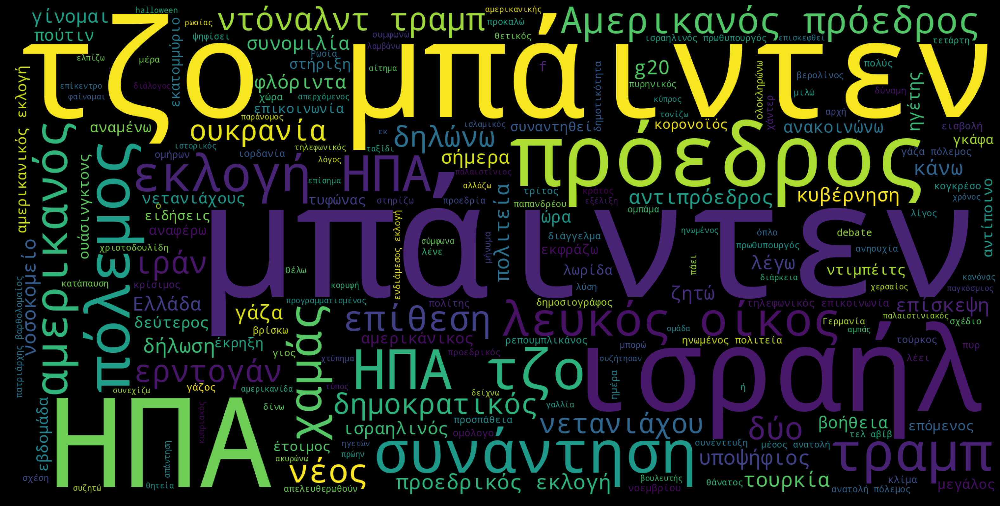

In [ ]:
create_wordcloud_img(tokenized_jan_doc)

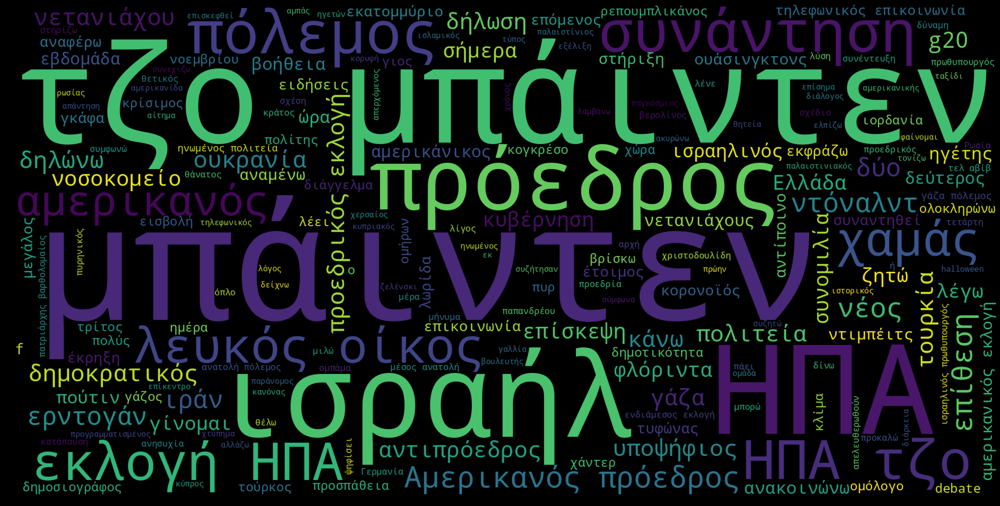

In [ ]:
nlp.Defaults.stop_words.add("τραμπ")
create_wordcloud_img(tokenized_jan_doc)

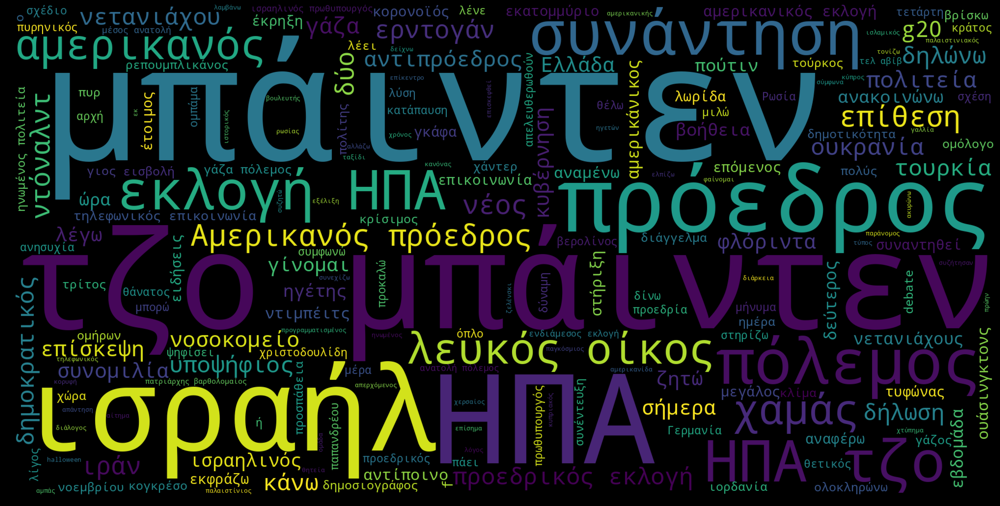

In [ ]:
nlp.Defaults.stop_words.add("ντοναλντ")
create_wordcloud_img(tokenized_jan_doc)

In [ ]:
wordcloud = create_wordcloud(tokenized_jan_doc)
frequencies = wordcloud.words_
print(frequencies)

{'μπάιντεν': 1.0, 'τζο μπάιντεν': 0.7009345794392523, 'ΗΠΑ': 0.5841121495327103, 'ισραήλ': 0.5093457943925234, 'πρόεδρος': 0.5, 'πόλεμος': 0.19626168224299065, 'συνάντηση': 0.19158878504672897, 'ΗΠΑ τζο': 0.16355140186915887, 'εκλογή ΗΠΑ': 0.14953271028037382, 'λευκός οίκος': 0.1308411214953271, 'χαμάς': 0.1261682242990654, 'αμερικανός': 0.1261682242990654, 'Αμερικανός πρόεδρος': 0.1261682242990654, 'επίθεση': 0.11682242990654206, 'νέος': 0.102803738317757, 'ντόναλντ': 0.09813084112149532, 'ιράν': 0.08878504672897196, 'δύο': 0.08878504672897196, 'ερντογάν': 0.08878504672897196, 'δημοκρατικός': 0.0794392523364486, 'δηλώνω': 0.0794392523364486, 'ουκρανία': 0.0794392523364486, 'νετανιάχου': 0.0794392523364486, 'προεδρικός εκλογή': 0.0794392523364486, 'κάνω': 0.07476635514018691, 'πολιτεία': 0.07476635514018691, 'υποψήφιος': 0.07476635514018691, 'τουρκία': 0.07476635514018691, 'δήλωση': 0.07009345794392523, 'γάζα': 0.07009345794392523, 'g20': 0.07009345794392523, 'αντιπρόεδρος': 0.07009345

In [ ]:
wordcloud = create_wordcloud(tokenized_jan_doc)
frequencies = wordcloud.words_
print(frequencies)

{'μπάιντεν': 1.0, 'τζο μπάιντεν': 0.7009345794392523, 'ΗΠΑ': 0.5841121495327103, 'ισραήλ': 0.5093457943925234, 'πρόεδρος': 0.5, 'πόλεμος': 0.19626168224299065, 'συνάντηση': 0.19158878504672897, 'ΗΠΑ τζο': 0.16355140186915887, 'εκλογή ΗΠΑ': 0.14953271028037382, 'λευκός οίκος': 0.1308411214953271, 'χαμάς': 0.1261682242990654, 'αμερικανός': 0.1261682242990654, 'Αμερικανός πρόεδρος': 0.1261682242990654, 'επίθεση': 0.11682242990654206, 'νέος': 0.102803738317757, 'ντόναλντ': 0.09813084112149532, 'ιράν': 0.08878504672897196, 'δύο': 0.08878504672897196, 'ερντογάν': 0.08878504672897196, 'δημοκρατικός': 0.0794392523364486, 'δηλώνω': 0.0794392523364486, 'ουκρανία': 0.0794392523364486, 'νετανιάχου': 0.0794392523364486, 'προεδρικός εκλογή': 0.0794392523364486, 'κάνω': 0.07476635514018691, 'πολιτεία': 0.07476635514018691, 'υποψήφιος': 0.07476635514018691, 'τουρκία': 0.07476635514018691, 'δήλωση': 0.07009345794392523, 'γάζα': 0.07009345794392523, 'g20': 0.07009345794392523, 'αντιπρόεδρος': 0.07009345

In [ ]:
jan_doc.ents

(λ.οίκο,
 ηπα,
 tραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 ηπα,
 ηπα,
 τραμπ,
 τραμπ,
 τραμπ,
 ηπα,
 βερολίνο,
 ουκρανία,
 ηπα,
 γερμανία,
 βερολίνο,
 ηπα,
 ηπα,
 ισραήλ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 γερμανία,
 ουάσιγκτον,
 ηπα,
 χαμάς,
 ηπα,
 χαμάς,
 ηπα,
 χαμάς μπάιντεν,
 χαμάς,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 οηε,
 ηπα,
 χαμάς,
 χαμάς,
 ηπα,
 χαμάς,
 ηπα,
 γερμανία,
 βρετανία,
 χαμάς,
 ηπα,
 ηπα,
 ηπα,
 χαμάς,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 χαμάς,
 ντόναλντ τραμπ,
 τραμπ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ουκρανία,
 ουκρανία,
 βραζιλία,
 λούλα,
 λούλα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 χέρτσογκ,
 ηπα,
 οηε,
 ηπα,
 ηπα,
 αφρική,
 ηπα,
 ουκρανία,
 ηπα,
 fbi,
 ηπα,
 fbi,
 fbi,
 χάντερ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ρετζέπ ταγίπ,
 ηπα,
 ηπα,
 ρετζέπ ταγίπ,
 ευρώπη,
 ρετζέπ ταγίπ,
 ηπα,
 γερμανία,
 άνγκελα μέρκελ,
 ρετζέπ ταγίπ,
 ηπα,
 τουρκία,
 twitter,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ελλάδας,
 νίκος,
 ηπα,
 ηπα,
 ελλάδα,
 ηπα,
 ελλάδα,
 ηπα,
 ελλάδα,
 ηπα,
 ηπα,


In [ ]:
for ent in jan_doc.ents:
  print(ent.text, ent.label_)

λ.οίκο PERSON
ηπα GPE
tραμπ PERSON
ντόναλντ τραμπ PERSON
τραμπ PERSON
ηπα GPE
ηπα GPE
τραμπ PERSON
τραμπ PERSON
τραμπ PERSON
ηπα GPE
βερολίνο GPE
ουκρανία GPE
ηπα GPE
γερμανία GPE
βερολίνο GPE
ηπα GPE
ηπα GPE
ισραήλ GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
γερμανία GPE
ουάσιγκτον GPE
ηπα GPE
χαμάς GPE
ηπα GPE
χαμάς GPE
ηπα GPE
χαμάς μπάιντεν ORG
χαμάς GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
οηε ORG
ηπα GPE
χαμάς GPE
χαμάς GPE
ηπα GPE
χαμάς GPE
ηπα GPE
γερμανία GPE
βρετανία GPE
χαμάς ORG
ηπα GPE
ηπα GPE
ηπα GPE
χαμάς GPE
ηπα GPE
ηπα GPE
ηπα GPE
τραμπ PERSON
χαμάς ORG
ντόναλντ τραμπ PERSON
τραμπ PERSON
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ουκρανία GPE
ουκρανία GPE
βραζιλία GPE
λούλα PERSON
λούλα PERSON
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
χέρτσογκ PERSON
ηπα GPE
οηε ORG
ηπα GPE
ηπα GPE
αφρική GPE
ηπα GPE
ουκρανία GPE
ηπα GPE
fbi ORG
ηπα GPE
fbi ORG
fbi ORG
χάντερ PERSON
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ρετζέπ ταγ